In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
from pathlib import Path
from tqdm import tqdm
import torch
import matplotlib.pyplot as plt
from PIL import Image
import sys
from scipy.spatial.transform import Rotation as R
sys.path.insert(0, 'video-head-tracker')

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [2]:
%cd video-head-tracker

/home/dmitry/clones/PanoHead/video-head-tracker


In [3]:
from vht.data.video import VideoDataset
from vht.model.tracking import FlameTracker
from vht.util.render import SHRenderer, create_camera_objects
from pytorch3d.structures.meshes import Meshes
from types import SimpleNamespace
from pytorch3d.utils import ico_sphere
from pytorch3d.renderer.mesh.rasterizer import Fragments
from pytorch3d.renderer import BlendParams, PerspectiveCameras, rasterize_meshes
import trimesh
from scipy.spatial.transform import Slerp

2023-10-23 04:19:37.551544: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-23 04:19:38.403013: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/dmitry/.miniconda3/envs/nha/lib/python3.9/site-packages/cv2/../../lib64:
2023-10-23 04:19:38.403109: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/dmitry/.miniconda3/envs/nha/lib/python3.9/sit

In [4]:
from argparse import ArgumentParser
from configargparse import ArgumentParser as ConfigArgumentParser

parser = ArgumentParser()
parser = FlameTracker.add_argparse_args(parser)

parser = ConfigArgumentParser(parents=[parser], add_help=False)
parser.add_argument("--config", required=True, is_config_file=True)
parser.add_argument("--data_path", required=True)
parser.add_argument("--threeddfa_dataset_json", required=False)
parser.add_argument("--video", required=False)
parser.add_argument(
    "--downscale_factor",
    type=float,
    default=1.0,
    help="Factor by which the input video is scaled to a lower resolution."
    " Mind that final pixel resolution is rounded to integer numbers.",
)

args = parser.parse_args([
    '--config', '../neural-head-avatars/configs/tracking.ini'
])
args_dict = vars(args)

# Control the full calibration initialization

In [5]:
from vht.util.graphics import (
    calibrate_camera,
    calibrate_extrinsics,
)

In [6]:
from pytorch3d.structures.meshes import Meshes

In [7]:
def rt2RT(r, t):
    RT = np.eye(4)
    RT[:3, :3] = R.from_rotvec(r).as_matrix()
    RT[:3, 3] = t
    return RT
def RT2rt(RT):
    r = R.from_matrix(RT[:3, :3]).as_rotvec()
    t = RT[:3, 3]
    return r, t
def get_flame_transform(tracker):
    r, t = tracker._rotation[0].data, tracker._translation[0].data
    t = t.detach().cpu().numpy()
    r = r.detach().cpu().numpy()
    tr = rt2RT(r, t)
    return tr
def applyrt(rt, verts):
    return (rt[:3, :3] @ verts.T + rt[:3, 3][:, None]).T
def RT34to44(RT):
    RT4 = np.eye(4)
    RT4[:3] = RT
    return RT4
def get_flame_vert_range_view(tracker, rt):
    verts, _, _ = tracker._forward_flame(0, False)
    verts_view = applyrt(rt, verts[0])
    return verts_view.min(0)[0], verts_view.max(0)[0]

In [8]:
data = VideoDataset(args.data_path, args.threeddfa_dataset_json, args.downscale_factor)
tracker = FlameTracker(data, **args_dict)

idx = 1
with torch.no_grad():
    tracker._initialize_from_triangulation(0)
    tracker._initialize_from_previous(1)


In [9]:
import trimesh
p = Path("../pti_out/easy-khair-180-gpc0.8-trans10-025000.pkl/PTI_render/")
mesh = trimesh.load(p / 'post_mesh' / 'mesh.obj')

Text(0.5, 1.0, 'Reference')

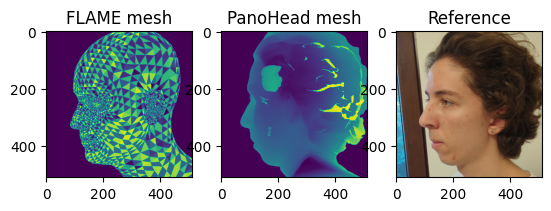

In [10]:
sample = tracker._get_current_frame(idx, False)
verts, _, _ = tracker._forward_flame(idx, False)

faces = tracker._flame.faces

# create cameras
K = sample["cam_intrinsic"]
RT = sample["cam_extrinsic"]
H, W = tracker._image_size
cameras = create_camera_objects(K, RT, (H, W), tracker._device)

def render_fragments(verts, faces):
    # create mesh from selected faces and vertices
    flame_meshes = Meshes(verts=verts, faces=faces.expand(len(verts), -1, -1))

    # rasterize fragments
    frag = tracker._render.rasterize(flame_meshes, cameras, (H, W), False)[0]
    return frag

frag = render_fragments(verts, faces)
frag_dmitry = render_fragments(
    torch.from_numpy(mesh.vertices).to(verts)[None], 
    torch.from_numpy(mesh.faces).to(faces)
)
plt.subplot(1, 3, 1)
plt.imshow(frag.pix_to_face[0, ..., 0].detach().cpu().numpy())
plt.title("FLAME mesh")
plt.subplot(1, 3, 2)
plt.imshow(frag_dmitry.pix_to_face[0, ..., 0].detach().cpu().numpy())
plt.title("PanoHead mesh")
plt.subplot(1, 3, 3)
plt.imshow((data[idx]['rgb'].permute(1, 2, 0).detach().cpu().numpy()) * 0.5 + 0.5)
plt.title("Reference")

In [11]:
rgb_gt = np.asarray(Image.open("../dataset/testdata_img/dmitry_1.jpg").resize((512, 512)))

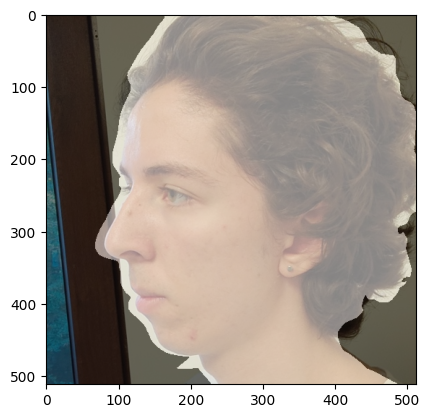

In [12]:
mesh_mask = frag_dmitry.pix_to_face[0, ..., 0].detach().cpu().numpy() != -1
# rgb = (data[idx]['rgb'].permute(1, 2, 0).detach().cpu().numpy()) * 0.5 + 0.5
rgb = rgb_gt / 255
rgb_masked = rgb * 0.5 + mesh_mask[..., None] * 0.5

plt.imshow(rgb_masked)

## Quaternion slerp

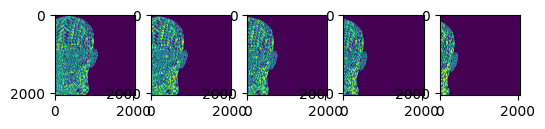

In [72]:
plt.figure(figsize=(6, 3))

r0 = R.from_matrix(data.c2w[0, :3, :3].cpu().numpy())
r1 = R.from_matrix(data.c2w[1, :3, :3].cpu().numpy())
t0 = data.c2w[0, :3, 3].clone()
t1 = data.c2w[1, :3, 3].clone()
slerp = Slerp([0, 1], R.concatenate([r0, r1]))
N = 50

imgs = []
for i in range(5):#N):
    data = VideoDataset(args.data_path, args.threeddfa_dataset_json, args.downscale_factor)
    tracker = FlameTracker(data, **args_dict)
    with torch.no_grad():
        tracker._initialize_from_calibration(0)
    # data.c2w[0] = data.c2w[i]
    t = i / (N - 1)
    r = slerp([t]).as_matrix()[0]
    data.c2w[0, :3, :3] = torch.from_numpy(r).to(data.c2w)
    # data.c2w[0, :3, 3] = t0 * (1 - t) + t1 * t
    sample = tracker._get_current_frame(0, False)

    verts, _, _ = tracker._forward_flame(0, False)

    rasterization_results = tracker._rasterize_flame(
        sample, verts, scale=tracker._config["sampling_scale"], use_cache=False
    )
    frag = rasterization_results["fragments"]
    plt.subplot(1, 5, i + 1)
    imgs.append(frag.pix_to_face[0, ..., 0].detach().cpu().numpy())
    plt.imshow(imgs[-1])

# Visualizations

## Plotly mesh

In [18]:
import plotly.graph_objects as go

In [19]:
def get_camera_cone_edges(world2cam, z, focal_length):
    pix_list = np.array([
        [-1, 1],
        [1, 1],
        [1, -1],
        [-1, -1],
    ]) / focal_length
    if world2cam.shape[0] == 3:
        world2cam = np.concatenate((world2cam, np.array([0, 0, 0, 1])[None]), axis=0)
    pix_list = np.concatenate([pix_list, np.ones((4, 1))], axis=1)
    pix_list_unprojected = pix_list * z
    pix_list_unprojected = np.concatenate([pix_list_unprojected, np.ones((4, 1))], axis=1)
    world_point_list = pix_list_unprojected @ np.linalg.inv(world2cam).T
    camera_pos = -np.linalg.inv(world2cam[:3, :3]) @ world2cam[:3, 3:]
    world_point_list = world_point_list[:, :3]
    edges = []
    for i in range(4):
        edges.append([world_point_list[i], world_point_list[(i + 1) % 4]])
        edges.append([camera_pos[:, 0], world_point_list[i]])
    return edges

In [20]:
import plotly.graph_objects as go

fig = go.Figure()

showed_camera = False
# Plot camera cone edges
focal_length = 8.4
z = 0.5
for i in range(len(data)):
    RT = RT34to44(data[i]['cam_extrinsic'].detach().cpu().numpy())
    edges = get_camera_cone_edges(RT, z=z, focal_length=focal_length)
    for e in edges:
        e = np.array(e)
        fig.add_trace(go.Scatter3d(x=e[:, 0], y=e[:, 1], z=e[:, 2], mode='lines', line=dict(color='green'), name='camera', legendgroup='camera', showlegend=not showed_camera))
        showed_camera = True

faces = tracker._flame.faces

fig.add_trace(go.Mesh3d(
        x = verts[0, :, 0].detach().cpu().numpy(),
        y = verts[0, :, 1].detach().cpu().numpy(),
        z = verts[0, :, 2].detach().cpu().numpy(),
        i = faces[:, 0].detach().cpu().numpy(),
        j = faces[:, 1].detach().cpu().numpy(),
        k = faces[:, 2].detach().cpu().numpy(),
    )
)

r = 2.5
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[-r, r]), 
        yaxis=dict(range=[-r, r]), 
        zaxis=dict(range=[-r, r])
    ),
    scene_camera=dict(
        # up=dict(x=0, y=1, z=0),
        # center=dict(x=0, y=0, z=2.5),
        # eye=dict(x=0, y=-1, z=0),
    )
)

fig.show()


In [17]:
import plotly.graph_objects as go

faces = tracker._flame.faces

fig = go.Figure(data=[
    go.Mesh3d(
        x = verts[0, :, 0].detach().cpu().numpy(),
        y = verts[0, :, 1].detach().cpu().numpy(),
        z = verts[0, :, 2].detach().cpu().numpy(),
        i = faces[:, 0].detach().cpu().numpy(),
        j = faces[:, 1].detach().cpu().numpy(),
        k = faces[:, 2].detach().cpu().numpy(),
    )
])

fig.show()

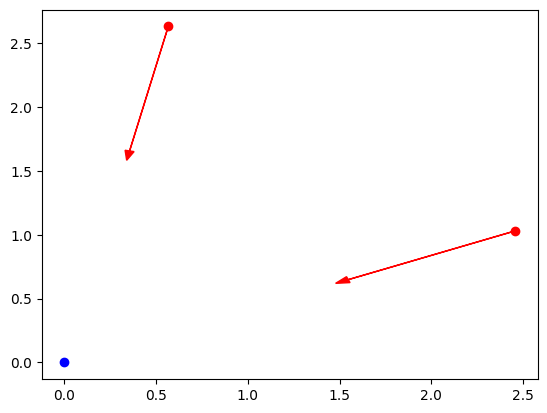

In [22]:
centers = []
for i in range(len(data)):
    c2w = np.linalg.inv(RT34to44(data[i]['cam_extrinsic'].detach().cpu().numpy()))
    c2w[:3, :3] = c2w[:3, :3].T
    forward = c2w[:3, 2]
    center = c2w[:3, 3]
    plt.scatter(*center[[0,2]], c='r')
    # Plot arrow from center to center+forward, width a pointy end
    plt.arrow(*center[[0,2]], *forward[[0,2]], color='r', head_width=0.05)

plt.scatter([0], [0], c='b')